In [1]:
 # Import modules
import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
# scanpy settings
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
sc._settings.ScanpyConfig.cache_compression = "gzip"
results_file = 'results.h5ad'

# Processing parameters
FILE_PATH = "GSE114727/"

scanpy==1.7.1 anndata==0.7.5 umap==0.5.1 numpy==1.20.2 scipy==1.6.2 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.9.1 leidenalg==0.8.3


In [3]:
# Read in data into a AnnData objects
adata_09_1 = sc.read_10x_mtx(
    FILE_PATH + 'GSM3148575_BC09_TUMOR1',
    prefix= "GSM3148575_BC09_TUMOR1_",
    cache=True)

adata_09_2 = sc.read_10x_mtx(
    FILE_PATH + 'GSM3148576_BC09_TUMOR2',
    prefix= "GSM3148576_BC09_TUMOR2_",
    cache=True)

adata_10 = sc.read_10x_mtx(
    FILE_PATH + 'GSM3148577_BC10_TUMOR1',
    prefix= "GSM3148577_BC10_TUMOR1_",
    cache=True)

adata_11_1 = sc.read_10x_mtx(
    FILE_PATH + 'GSM3148578_BC11_TUMOR1',
    prefix= "GSM3148578_BC11_TUMOR1_",
    cache=True)

adata_11_2 = sc.read_10x_mtx(
    FILE_PATH + 'GSM3148579_BC11_TUMOR2',
    prefix= "GSM3148579_BC11_TUMOR2_",
    cache=True)

... reading from cache file cache\GSE114727-GSM3148575_BC09_TUMOR1-GSM3148575_BC09_TUMOR1_matrix.h5ad
... reading from cache file cache\GSE114727-GSM3148576_BC09_TUMOR2-GSM3148576_BC09_TUMOR2_matrix.h5ad
... reading from cache file cache\GSE114727-GSM3148577_BC10_TUMOR1-GSM3148577_BC10_TUMOR1_matrix.h5ad
... reading from cache file cache\GSE114727-GSM3148578_BC11_TUMOR1-GSM3148578_BC11_TUMOR1_matrix.h5ad
... reading from cache file cache\GSE114727-GSM3148579_BC11_TUMOR2-GSM3148579_BC11_TUMOR2_matrix.h5ad


In [4]:
# Print summaries for all datasets
dataset_names = ["GSM3148575_BC09_TUMOR1", "GSM3148576_BC09_TUMOR2", "GSM3148577_BC10_TUMOR1", "GSM3148578_BC11_TUMOR1", "GSM3148579_BC11_TUMOR2"]
dataset_list = [adata_09_1, adata_09_2, adata_10, adata_11_1, adata_11_1]
datasets = zip(dataset_names, dataset_list)
obs_n = 0

print("----Dataset summaries----")
for dataset in datasets:
    print(dataset[0])
    print(f"Obs: {dataset[1].shape[0]}, Vars: {dataset[1].shape[1]}\n")
    obs_n += dataset[1].shape[0]

print(f"Total obs: {obs_n}")
print(f"Total Vars {dataset[1].shape[1]}")

----Dataset summaries----
GSM3148575_BC09_TUMOR1
Obs: 7096, Vars: 33694

GSM3148576_BC09_TUMOR2
Obs: 6889, Vars: 33694

GSM3148577_BC10_TUMOR1
Obs: 4926, Vars: 33694

GSM3148578_BC11_TUMOR1
Obs: 5232, Vars: 33694

GSM3148579_BC11_TUMOR2
Obs: 5232, Vars: 33694

Total obs: 29375
Total Vars 33694


In [5]:
# Integrate datasets
integrated_adata = adata_09_1.concatenate(
    adata_09_2,
    adata_10,
    adata_11_1,
    adata_11_2, 
    batch_categories=["BC09_TUMOR1", "BC09_TUMOR2", "BC10_TUMOR1", "BC11_TUMOR1", "BC11_TUMOR2"],
    join = "outer",
    batch_key = "Sample",
    index_unique = "|")

In [6]:
# Define a helper function to remap the cell ID
def split_id(id):
    id_split = id.split("@")
    return id_split[1] + "|" + id_split[0]

# Read in metadata
metadata = pd.read_csv(FILE_PATH + "BRCA_GSE114727_10X_CellMetainfo_table.tsv", sep = "\t")

# Remap the cell ID
metadata["CellID"] = metadata["Cell"].apply(split_id)
metadata = metadata.set_index("CellID")

# Filter out uniteresting variables
metadata = metadata[
    ["Sample",
    "Celltype (major-lineage)",
    "Celltype (minor-lineage)",
    "Age",
    "Gender"]]

In [7]:
# Filter out cells in the dataset that have no metadata
common = integrated_adata.obs.index.isin(metadata.index.to_series())
integrated_adata = integrated_adata[common]

print(f"[INFO] Removed {obs_n - common.sum()} samples due to missing metadata")

[INFO] Removed 697 samples due to missing metadata
c:\Users\spack\OneDrive - King's College London\Individual Project\scanpy_2\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [8]:
integrated_adata_index = integrated_adata.obs.index.to_series()
metadata.reindex(integrated_adata_index)

,Sample,Celltype (major-lineage),Celltype (minor-lineage),Age,Gender
AAACCTGAGCAGACTG-1|BC09_TUMOR1,BC09_TUMOR1,CD8Tex,CD8Tex,65,Female
AAACCTGAGGTCGGAT-1|BC09_TUMOR1,BC09_TUMOR1,CD8T,CD8Tn,65,Female
AAACCTGAGTGTACCT-1|BC09_TUMOR1,BC09_TUMOR1,Treg,Treg,65,Female
AAACCTGAGTGTACTC-1|BC09_TUMOR1,BC09_TUMOR1,CD8Tex,CD8Tex,65,Female
AAACCTGAGTTAAGTG-1|BC09_TUMOR1,BC09_TUMOR1,CD4Tconv,Th17,65,Female
...,...,...,...,...,...
TTTGTCAGTGATGTGG-1|BC11_TUMOR2,BC11_TUMOR2,CD8T,CD8Tcm,50,Female
TTTGTCATCAAAGACA-1|BC11_TUMOR2,BC11_TUMOR2,CD4Tconv,Tfh,50,Female
TTTGTCATCAACACAC-1|BC11_TUMOR2,BC11_TUMOR2,Treg,Treg,50,Female
TTTGTCATCACGCGGT-1|BC11_TUMOR2,BC11_TUMOR2,CD8T,CD8Tcm,50,Female


In [9]:
integrated_adata.obs = metadata

## Preprocessing

In [10]:
# Basic filtering
sc.pp.filter_cells(integrated_adata, min_genes=200)
sc.pp.filter_genes(integrated_adata, min_cells=3)

filtered out 14545 genes that are detected in less than 3 cells


In [11]:
# Compute metrics
sc.pp.calculate_qc_metrics(integrated_adata, percent_top=None, log1p=False, inplace=True)

In [12]:
integrated_adata

AnnData object with n_obs × n_vars = 28678 × 19149
    obs: 'Sample', 'Celltype (major-lineage)', 'Celltype (minor-lineage)', 'Age', 'Gender', 'n_genes', 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

... storing 'Sample' as categorical
... storing 'Celltype (major-lineage)' as categorical
... storing 'Celltype (minor-lineage)' as categorical
... storing 'Gender' as categorical


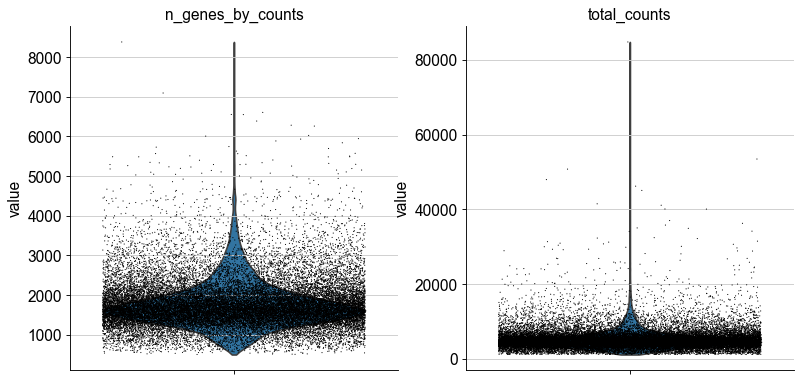

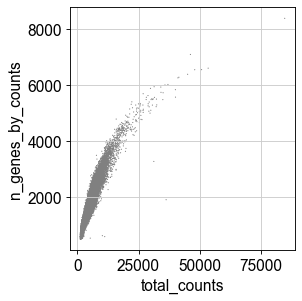

In [13]:
# Check data quality with violin and scatter plots
sc.pl.violin(integrated_adata, ['n_genes_by_counts', 'total_counts'], jitter=0.4, multi_panel=True)
sc.pl.scatter(integrated_adata, x='total_counts', y='n_genes_by_counts')

In [14]:
# Remove samples with too many gene counts
integrated_adata = integrated_adata[integrated_adata.obs.n_genes_by_counts < 5000, :]

c:\Users\spack\OneDrive - King's College London\Individual Project\scanpy_2\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [15]:
# Normalise and logarithmise the matrix
sc.pp.normalize_total(integrated_adata, target_sum=1e4)
sc.pp.log1p(integrated_adata)

c:\Users\spack\OneDrive - King's College London\Individual Project\scanpy_2\lib\site-packages\scanpy\preprocessing\_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


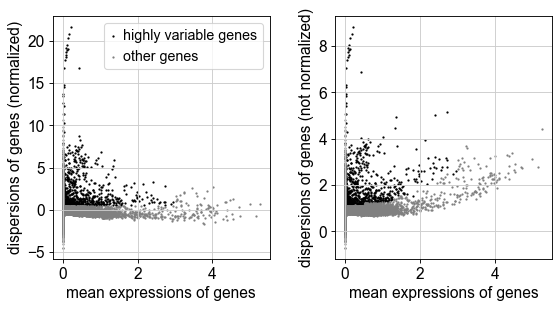

In [16]:
# Identify highly expressed genes
sc.pp.highly_variable_genes(integrated_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(integrated_adata)

In [17]:
# Set raw attribute to be the processed data
integrated_adata.raw = integrated_adata

In [18]:
# Filter out non-highly expressed genes
integrated_adata = integrated_adata[:, integrated_adata.var.highly_variable]

# Scale the data
sc.pp.scale(integrated_adata, max_value=10)

c:\Users\spack\OneDrive - King's College London\Individual Project\scanpy_2\lib\site-packages\scanpy\preprocessing\_simple.py:810: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


## PCA

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


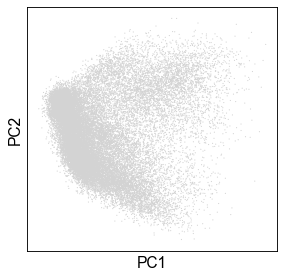

In [19]:
sc.tl.pca(integrated_adata, svd_solver='arpack')
sc.pl.pca(integrated_adata)

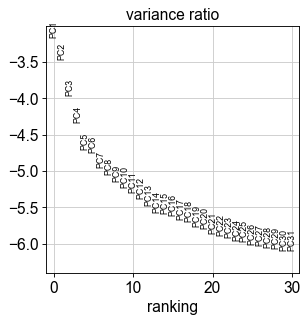

In [20]:
# Identify the PCs contributing to the total variance
sc.pl.pca_variance_ratio(integrated_adata, log=True)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:30)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:27)


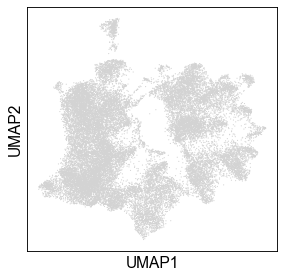

In [21]:
# Carry out UMAP
sc.pp.neighbors(integrated_adata, n_neighbors=10, n_pcs=40)

sc.tl.umap(integrated_adata)
sc.pl.umap(integrated_adata)

## Clustering

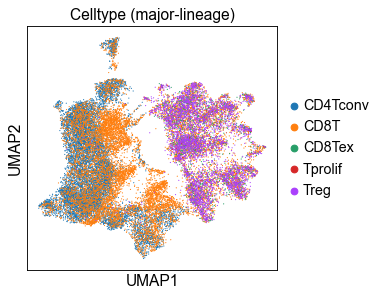

In [23]:
sc.pl.umap(integrated_adata, color='Celltype (major-lineage)')

In [25]:
export_data_values = pd.DataFrame(integrated_adata.X, index = integrated_adata.obs.index, columns = integrated_adata.var.index)
export_data_anno = pd.DataFrame(integrated_adata.obs.values, index = integrated_adata.obs.index, columns = integrated_adata.obs.columns.values)
export_data_anno = export_data_anno.iloc[:,:-3]

export_data = pd.concat([export_data_values, export_data_anno], axis = 1)

In [ ]:
# Save count matrix
export_data.to_csv("sc_integrated_data.csv")

In [31]:
# Write results
integrated_adata.write(results_file)

In [30]:
export_data_values.shape

(28618, 834)